In [1]:
#Import packages
import geopandas as gpd
import pandas as pd
import plotly.express as px
from sodapy import Socrata
import folium

In [2]:
#read in EJSM df and make string
df = pd.read_csv(
'Data/EJSM_Scores/EJSM_Scores (1).csv' ,
dtype={
    'Tract_1':str
})

In [3]:
#add number zero leading the FIPS code for merging the data with the census tract data
df['Tract_1'] = df['Tract_1'].str.zfill(11)
df.head()

,OBJECTID,Tract_1,CIscore,HazScore,HealthScore,SVscore,CCVscore,Shape__Area,Shape__Length
0,1,06037920336,10,3,1,4,2,2.438560e+06,8124.373091
1,2,06037920044,4,1,1,1,1,1.470811e+06,5545.298452
2,3,06037573003,13,5,3,3,2,6.528168e+05,3310.743793
3,4,06037571704,13,3,2,4,4,6.994011e+05,4113.477175
4,5,06037570403,17,5,3,5,4,8.317839e+05,3887.000394


In [4]:
#import 2012 census data
tracts=gpd.read_file('Data/CensusData2012/census-tracts-2012.geojson')
print(tracts)

                     kind  external_id         name  \
0     Census Tract (2012)  06037101110  06037101110   
1     Census Tract (2012)  06037101122  06037101122   
2     Census Tract (2012)  06037101210  06037101210   
3     Census Tract (2012)  06037101220  06037101220   
4     Census Tract (2012)  06037101300  06037101300   
...                   ...          ...          ...   
2341  Census Tract (2012)  06037980031  06037980031   
2342  Census Tract (2012)  06037980033  06037980033   
2343  Census Tract (2012)  06037990100  06037990100   
2344  Census Tract (2012)  06037990200  06037990200   
2345  Census Tract (2012)  06037990300  06037990300   

                               slug                                    set  \
0     06037101110-census-tract-2012  /1.0/boundary-set/census-tracts-2012/   
1     06037101122-census-tract-2012  /1.0/boundary-set/census-tracts-2012/   
2     06037101210-census-tract-2012  /1.0/boundary-set/census-tracts-2012/   
3     06037101220-census-tr

In [5]:
#list column names
list(tracts)

['kind',
 'external_id',
 'name',
 'slug',
 'set',
 'metadata',
 'resource_uri',
 'geometry']

In [6]:
#drop columns
columns_to_drop = ['set','kind','resource_uri','metadata']
#read columns 
tracts.head()

,kind,external_id,name,slug,set,metadata,resource_uri,geometry
0,Census Tract (2012),06037101110,06037101110,06037101110-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2594737', 'NAME': '1011.10',...",/1.0/boundary/06037101110-census-tract-2012/,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007..."
1,Census Tract (2012),06037101122,06037101122,06037101122-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2677213', 'NAME': '1011.22',...",/1.0/boundary/06037101122-census-tract-2012/,"MULTIPOLYGON (((-118.30333 34.27354, -118.3031..."
2,Census Tract (2012),06037101210,06037101210,06037101210-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2529724', 'NAME': '1012.10',...",/1.0/boundary/06037101210-census-tract-2012/,"MULTIPOLYGON (((-118.29945 34.25598, -118.2859..."
3,Census Tract (2012),06037101220,06037101220,06037101220-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2516085', 'NAME': '1012.20',...",/1.0/boundary/06037101220-census-tract-2012/,"MULTIPOLYGON (((-118.28592 34.24896, -118.2859..."
4,Census Tract (2012),06037101300,06037101300,06037101300-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2487732', 'NAME': '1013', 'I...",/1.0/boundary/06037101300-census-tract-2012/,"MULTIPOLYGON (((-118.27247 34.23253, -118.2719..."


In [7]:
#drop columns from tracts data
tracts = tracts.drop(columns_to_drop,axis=1)

In [8]:
#show tracts info
tracts.info(verbose=True, null_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2346 entries, 0 to 2345
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   external_id  2346 non-null   object  
 1   name         2346 non-null   object  
 2   slug         2346 non-null   object  
 3   geometry     2346 non-null   geometry
dtypes: geometry(1), object(3)
memory usage: 73.4+ KB


In [9]:
#isolate the FIPS code and geometry column to match with the EJSM data
tracts = tracts[['name','geometry']]
tracts.head()

,name,geometry
0,06037101110,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007..."
1,06037101122,"MULTIPOLYGON (((-118.30333 34.27354, -118.3031..."
2,06037101210,"MULTIPOLYGON (((-118.29945 34.25598, -118.2859..."
3,06037101220,"MULTIPOLYGON (((-118.28592 34.24896, -118.2859..."
4,06037101300,"MULTIPOLYGON (((-118.27247 34.23253, -118.2719..."


In [10]:
#show columns
tracts.columns = ['FIPS','geometry']
tracts.head()

,FIPS,geometry
0,06037101110,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007..."
1,06037101122,"MULTIPOLYGON (((-118.30333 34.27354, -118.3031..."
2,06037101210,"MULTIPOLYGON (((-118.29945 34.25598, -118.2859..."
3,06037101220,"MULTIPOLYGON (((-118.28592 34.24896, -118.2859..."
4,06037101300,"MULTIPOLYGON (((-118.27247 34.23253, -118.2719..."


In [11]:
#rename Tract_1 to FIPS
df.columns = ['OBJECTID',
 'FIPS',
 'CIscore',
 'HazScore',
 'HealthScore',
 'SVscore',
 'CCVscore',
 'Shape__Area',
 'Shape__Length']
df.head()

,OBJECTID,FIPS,CIscore,HazScore,HealthScore,SVscore,CCVscore,Shape__Area,Shape__Length
0,1,06037920336,10,3,1,4,2,2.438560e+06,8124.373091
1,2,06037920044,4,1,1,1,1,1.470811e+06,5545.298452
2,3,06037573003,13,5,3,3,2,6.528168e+05,3310.743793
3,4,06037571704,13,3,2,4,4,6.994011e+05,4113.477175
4,5,06037570403,17,5,3,5,4,8.317839e+05,3887.000394


In [12]:
#list df
list(df)

['OBJECTID',
 'FIPS',
 'CIscore',
 'HazScore',
 'HealthScore',
 'SVscore',
 'CCVscore',
 'Shape__Area',
 'Shape__Length']

In [13]:
#merge data on the same object FIPS
tracts_ejsm=tracts.merge(df,on="FIPS")
#show merge with census data (only population)
tracts_ejsm.head()

,FIPS,geometry,OBJECTID,CIscore,HazScore,HealthScore,SVscore,CCVscore,Shape__Area,Shape__Length
0,06037101110,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007...",1464,10,3,1,3,3,1.677572e+06,5561.283410
1,06037101122,"MULTIPOLYGON (((-118.30333 34.27354, -118.3031...",672,4,1,1,1,1,3.891711e+06,11660.850429
2,06037101210,"MULTIPOLYGON (((-118.29945 34.25598, -118.2859...",1446,14,4,1,4,5,9.516179e+05,4451.778658
3,06037101220,"MULTIPOLYGON (((-118.28592 34.24896, -118.2859...",1703,12,3,1,4,4,1.026836e+06,4673.869604
4,06037101300,"MULTIPOLYGON (((-118.27247 34.23253, -118.2719...",1579,5,1,1,1,2,3.781233e+06,10813.184183


In [14]:
#describe stats by proximity to hazard score
tracts_ejsm['HazScore'].describe()

count    2342.000000
mean        2.976943
std         1.434123
min         0.000000
25%         2.000000
50%         3.000000
75%         4.000000
max         5.000000
Name: HazScore, dtype: float64

In [15]:
#ADD HIST

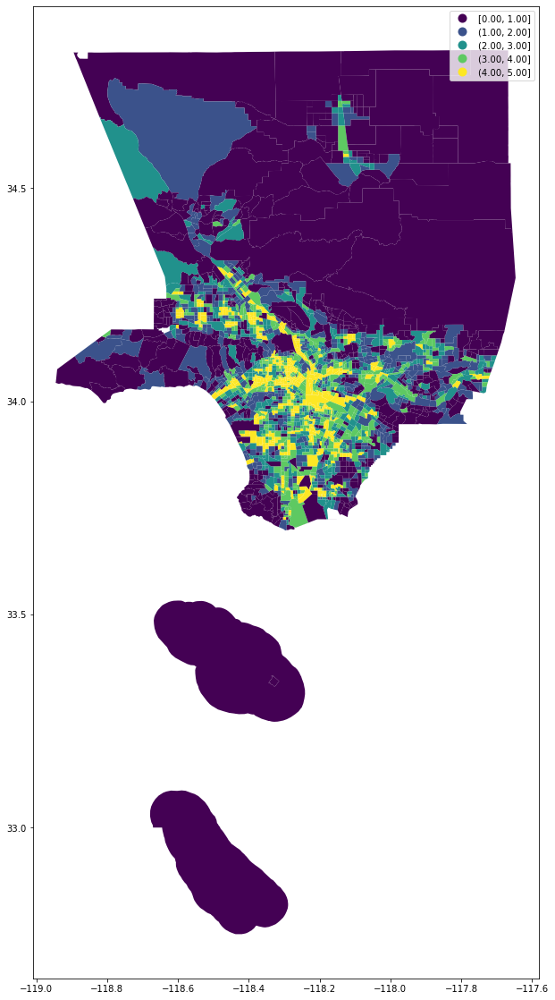

In [16]:
#plot HazScore
tracts_ejsm.plot(figsize=(24,20),
                 column='HazScore',
                 legend=True, 
                 scheme='equal_interval')

In [17]:
# folium map for HazScore
m = folium.Map(location=[34.2,-118.2], 
               zoom_start = 9,
               tiles='CartoDB positron', 
               attribution='CartoDB')

# plot chorpleth over the base map
folium.Choropleth(
                  geo_data=tracts_ejsm, # geo data
                  data=tracts_ejsm, # data          
                  key_on='feature.properties.FIPS', # key, or merge column
                  columns=['FIPS', 'HazScore'], # [key, value]
                  fill_color='BuPu',
                  line_weight=0.1, 
                  fill_opacity=0.8,
                  line_opacity=0.2, # line opacity (of the border)
                  legend_name='Degree of proximity to Environmenta Hazards)').add_to(m)
m

In [18]:
#use API to import crime data
client = Socrata("data.lacity.org", None)
results = client.get("amvf-fr72", limit=10000)
df =pd.DataFrame.from_records(results)

In [19]:
df.sample(7)

,rpt_id,report_type,arst_date,time,area,area_desc,rd,age,sex_cd,descent_cd,...,:@computed_region_k96s_3jcv,:@computed_region_tatf_ua23,bkg_date,:@computed_region_ur2y_g4cx,bkg_time,:@computed_region_kqwf_mjcx,bgk_location,:@computed_region_2dna_qi2s,bkg_loc_cd,dispo_desc
8748,201611295,RFC,2020-07-22T00:00:00.000,1105,16,Foothill,1685,33,F,H,...,162,475,NaN,NaN,NaN,3,NaN,14,NaN,MISDEMEANOR COMPLAINT FILED
9829,5994465,BOOKING,2020-08-18T00:00:00.000,2150,14,Pacific,1494,26,M,O,...,2340,445,2020-08-19T00:00:00.000,12,0122,10,77TH ST,16,4212,DISTRICT ATTORNEY REJECT
2133,201710883,RFC,2020-07-03T00:00:00.000,1000,17,Devonshire,1775,59,M,O,...,104,1422,NaN,NaN,NaN,2,NaN,87,NaN,MISDEMEANOR COMPLAINT FILED
7991,5976096,BOOKING,2020-07-21T00:00:00.000,1715,14,Pacific,1431,47,M,B,...,909,1263,2020-07-21T00:00:00.000,10,1727,10,PACIFIC,30,4214,MISDEMEANOR COMPLAINT FILED
3895,200212308,RFC,2020-07-08T00:00:00.000,1033,02,Rampart,0201,37,M,B,...,437,730,NaN,16,NaN,8,NaN,58,NaN,MISDEMEANOR COMPLAINT FILED
6023,6012306,BOOKING,2020-09-15T00:00:00.000,0050,02,Rampart,0281,32,M,H,...,574,908,2020-09-15T00:00:00.000,NaN,0505,11,METRO - JAIL DIVISION,8,4273,MISDEMEANOR COMPLAINT FILED
2753,5929880,BOOKING,2020-05-11T00:00:00.000,1445,16,Foothill,1653,18,M,B,...,34,451,2020-05-11T00:00:00.000,NaN,1623,1,VALLEY - JAIL DIV,11,4279,DISTRICT ATTORNEY REJECT


In [20]:
#get description of data and types
df.grp_description.unique()

array(['Robbery', nan, 'Liquor Laws', 'Aggravated Assault',
       'Prostitution/Allied', 'Narcotic Drug Laws',
       'Driving Under Influence', 'Gambling', 'Burglary', 'Drunkeness',
       'Vehicle Theft', 'Miscellaneous Other Violations',
       'Other Assaults', 'Against Family/Child', 'Fraud/Embezzlement',
       'Weapon (carry/poss)', 'Moving Traffic Violations',
       'Disorderly Conduct', 'Forgery/Counterfeit', 'Homicide',
       'Receive Stolen Property', 'Non-Criminal Detention', 'Larceny',
       'Rape', 'Sex (except rape/prst)', 'Disturbing the Peace',
       'Pre-Delinquency'], dtype=object)

In [21]:
#check for laty and lon
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 31 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   rpt_id                       10000 non-null  object
 1   report_type                  10000 non-null  object
 2   arst_date                    10000 non-null  object
 3   time                         10000 non-null  object
 4   area                         10000 non-null  object
 5   area_desc                    10000 non-null  object
 6   rd                           10000 non-null  object
 7   age                          10000 non-null  object
 8   sex_cd                       10000 non-null  object
 9   descent_cd                   10000 non-null  object
 10  chrg_grp_cd                  9308 non-null   object
 11  grp_description              9308 non-null   object
 12  arst_typ_cd                  10000 non-null  object
 13  charge                       100

In [22]:
#plotly bar graph to examine the total arrests by LAPD in 2020
px.bar(df,
       x='arst_date',
       title='LAPD Arrests in 2020',
       labels={'arst_date':'Arrest date','counts':'Number of arrests'}
      )

In [23]:
#get arrest charge value counts
arrest_by_charge = df.grp_description.value_counts().reset_index()
arrest_by_charge

,index,grp_description
0,Aggravated Assault,1577
1,Miscellaneous Other Violations,1381
2,Driving Under Influence,996
3,Other Assaults,909
4,Narcotic Drug Laws,860
5,Vehicle Theft,678
6,Weapon (carry/poss),518
7,Burglary,448
8,Robbery,327
9,Larceny,255


In [24]:
#join data with FIPS
#configure geometry for crime dataframe 
crime = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.lon, df.lat))

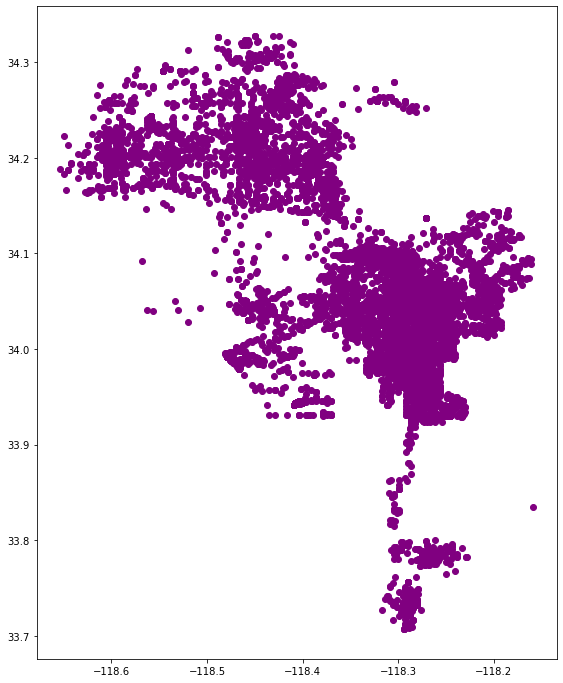

In [25]:
#plot crime
crime.plot(figsize=(12,12),color='purple')

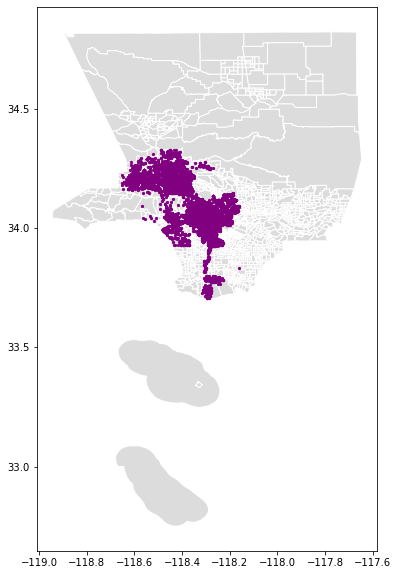

In [26]:
#make base layer map ands overlay plot 
base = tracts_ejsm.plot(figsize=(12,10),color='gainsboro', edgecolor='white')

ax = crime.plot(ax=base, color='purple', markersize=5)

In [27]:
#print total bounds of data points 
minx, miny, maxx, maxy = crime.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)

-118.6536
-118.1589
33.707
34.3274


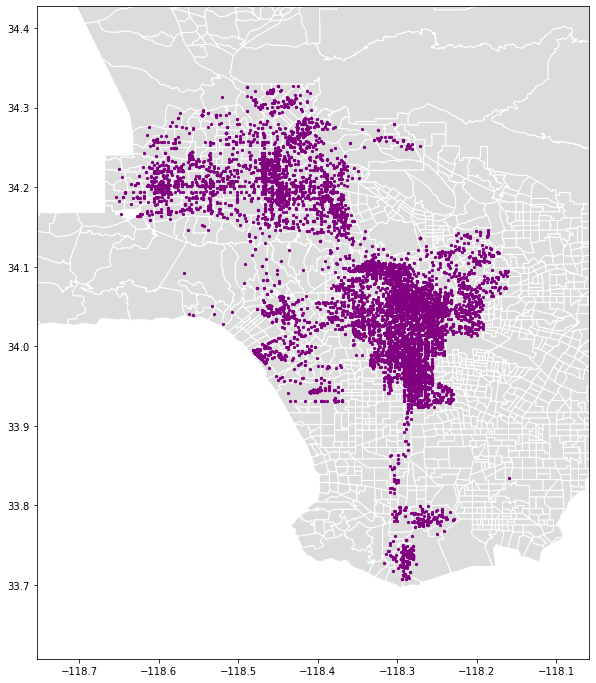

In [28]:
#print map with within closer boundaries 
base = tracts_ejsm.plot(figsize=(12,12),color='gainsboro', edgecolor='white')
ax = crime.plot(ax=base, marker='o', color='purple', markersize=5)
ax.set_xlim(minx - .1, maxx + .1)
ax.set_ylim(miny - .1, maxy + .1)
ax

In [29]:
# configure coordinate reference system for tracts to join the two dataframes
tracts_ejsm.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [30]:
# configure coordinate reference system for crime
crime.set_crs(epsg=4326, inplace=True)
crime.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [31]:
#join tracts_ejsm and crime data- probably need to reset.index()
join = gpd.sjoin(tracts_ejsm,
                 crime,
                 how='right')

In [32]:
join.head()

,index_left,FIPS,OBJECTID,CIscore,HazScore,HealthScore,SVscore,CCVscore,Shape__Area,Shape__Length,...,:@computed_region_tatf_ua23,bkg_date,:@computed_region_ur2y_g4cx,bkg_time,:@computed_region_kqwf_mjcx,bgk_location,:@computed_region_2dna_qi2s,bkg_loc_cd,dispo_desc,geometry
9361,0.0,06037101110,1464.0,10.0,3.0,1.0,3.0,3.0,1.677572e+06,5561.28341,...,260,2020-09-05T00:00:00.000,18,0218,1,VALLEY - JAIL DIV,7,4279,MISDEMEANOR COMPLAINT FILED,POINT (-118.30020 34.25670)
9593,0.0,06037101110,1464.0,10.0,3.0,1.0,3.0,3.0,1.677572e+06,5561.28341,...,1270,2020-09-10T00:00:00.000,NaN,1410,1,VALLEY - JAIL DIV,7,4279,MISDEMEANOR COMPLAINT FILED,POINT (-118.29320 34.25780)
9504,0.0,06037101110,1464.0,10.0,3.0,1.0,3.0,3.0,1.677572e+06,5561.28341,...,1270,2020-08-17T00:00:00.000,NaN,0201,1,VALLEY - JAIL DIV,7,4279,DISTRICT ATTORNEY REJECT,POINT (-118.29300 34.25950)
1140,0.0,06037101110,1464.0,10.0,3.0,1.0,3.0,3.0,1.677572e+06,5561.28341,...,1270,2020-06-25T00:00:00.000,NaN,1440,1,VALLEY - JAIL DIV,7,4279,849(B)(1) PC/TECHNICAL ARREST,POINT (-118.29300 34.25950)
2877,0.0,06037101110,1464.0,10.0,3.0,1.0,3.0,3.0,1.677572e+06,5561.28341,...,1270,2020-07-27T00:00:00.000,NaN,0311,1,VALLEY - JAIL DIV,7,4279,MISDEMEANOR COMPLAINT FILED,POINT (-118.29300 34.25950)


In [33]:
join.sample(5)

,index_left,FIPS,OBJECTID,CIscore,HazScore,HealthScore,SVscore,CCVscore,Shape__Area,Shape__Length,...,:@computed_region_tatf_ua23,bkg_date,:@computed_region_ur2y_g4cx,bkg_time,:@computed_region_kqwf_mjcx,bgk_location,:@computed_region_2dna_qi2s,bkg_loc_cd,dispo_desc,geometry
6931,741.0,06037232500,981.0,17.0,5.0,3.0,5.0,4.0,1.121580e+06,4394.194707,...,1051,2020-09-24T00:00:00.000,7,1343,14,77TH ST,35,4212,MISDEMEANOR COMPLAINT FILED,POINT (-118.30890 33.98930)
2354,315.0,06037139301,1737.0,10.0,3.0,5.0,1.0,1.0,4.225998e+06,9911.152548,...,1493,NaN,NaN,NaN,4,NaN,10,NaN,MISDEMEANOR COMPLAINT FILED,POINT (-118.56000 34.17930)
25,864.0,06037267502,1802.0,12.0,3.0,5.0,2.0,2.0,6.353960e+05,3286.968460,...,750,NaN,9,NaN,10,NaN,50,NaN,MISDEMEANOR COMPLAINT FILED,POINT (-118.46370 34.03950)
8167,539.0,06037207301,233.0,18.0,5.0,5.0,3.0,5.0,6.247372e+05,4486.086220,...,683,2020-06-25T00:00:00.000,NaN,1727,9,METRO - JAIL DIVISION,76,4273,FELONY COMPLAINT FILED,POINT (-118.25200 34.04670)
4499,544.0,06037207710,402.0,17.0,5.0,5.0,2.0,5.0,1.600719e+06,6336.760838,...,733,NaN,NaN,NaN,9,NaN,76,NaN,MISDEMEANOR COMPLAINT FILED,POINT (-118.25250 34.04920)


In [34]:
#subset the data
df = pd.DataFrame(join,columns=['arst_date','rpt_id','grp_description','arst_typ_cd','HazScore', 'CIscore','FIPS','lat','lon','geometry'])
print(df)

                    arst_date     rpt_id                 grp_description  \
9361  2020-09-04T00:00:00.000    6005984         Driving Under Influence   
9593  2020-09-10T00:00:00.000    6009503                  Other Assaults   
9504  2020-08-16T00:00:00.000    5993355  Miscellaneous Other Violations   
1140  2020-06-25T00:00:00.000    5960579                  Other Assaults   
2877  2020-07-27T00:00:00.000    5979399                  Other Assaults   
...                       ...        ...                             ...   
9652  2020-08-25T00:00:00.000    5999013                         Robbery   
9778  2020-08-24T00:00:00.000    5998508              Aggravated Assault   
9832  2020-09-04T00:00:00.000    6006010  Miscellaneous Other Violations   
9875  2020-08-31T00:00:00.000  202100834              Narcotic Drug Laws   
9968  2020-09-09T00:00:00.000    6008421         Receive Stolen Property   

     arst_typ_cd  HazScore  CIscore         FIPS      lat        lon  \
9361           

In [35]:
#subset data
df.head()

,arst_date,rpt_id,grp_description,arst_typ_cd,HazScore,CIscore,FIPS,lat,lon,geometry
9361,2020-09-04T00:00:00.000,6005984,Driving Under Influence,M,3.0,10.0,06037101110,34.2567,-118.3002,POINT (-118.30020 34.25670)
9593,2020-09-10T00:00:00.000,6009503,Other Assaults,M,3.0,10.0,06037101110,34.2578,-118.2932,POINT (-118.29320 34.25780)
9504,2020-08-16T00:00:00.000,5993355,Miscellaneous Other Violations,F,3.0,10.0,06037101110,34.2595,-118.293,POINT (-118.29300 34.25950)
1140,2020-06-25T00:00:00.000,5960579,Other Assaults,F,3.0,10.0,06037101110,34.2595,-118.293,POINT (-118.29300 34.25950)
2877,2020-07-27T00:00:00.000,5979399,Other Assaults,M,3.0,10.0,06037101110,34.2595,-118.293,POINT (-118.29300 34.25950)


In [36]:
crime_by_tracts = join.FIPS.value_counts().rename_axis('Tract').reset_index(name='crime_count')
crime_by_tracts.head()

,Tract,crime_count
0,06037980028,235
1,06037273402,130
2,06037206300,112
3,06037237600,99
4,06037190700,86


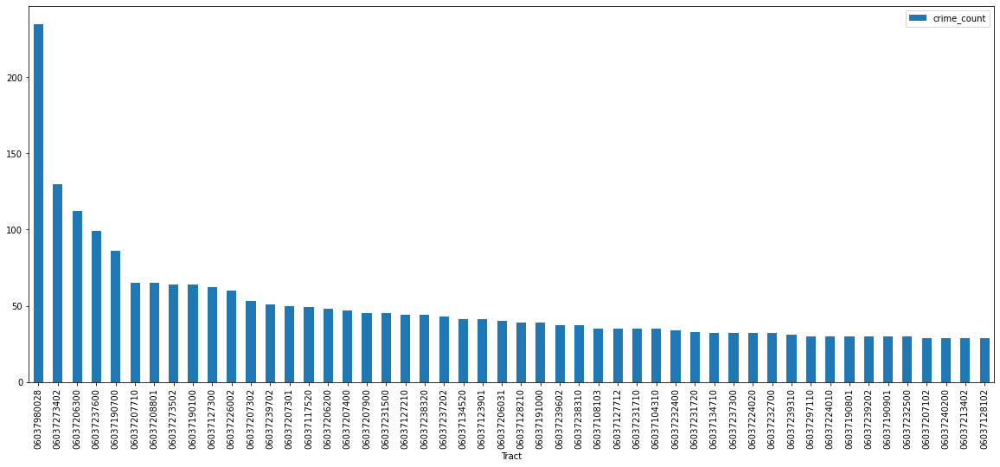

In [37]:
crime_by_tracts[:50].plot.bar(figsize=(20,8),x='Tract',y='crime_count')

In [38]:
##group data by the description of arrest- FIPS out of order
df.groupby(['grp_description']).count()

,arst_date,rpt_id,arst_typ_cd,HazScore,CIscore,FIPS,lat,lon,geometry
grp_description,,,,,,,,,
Against Family/Child,106,106,106,105,105,105,106,106,106
Aggravated Assault,1586,1586,1586,1575,1575,1575,1586,1586,1586
Burglary,451,451,451,451,451,451,451,451,451
Disorderly Conduct,37,37,37,37,37,37,37,37,37
Disturbing the Peace,6,6,6,6,6,6,6,6,6
Driving Under Influence,1000,1000,1000,992,992,992,1000,1000,1000
Drunkeness,163,163,163,162,162,162,163,163,163
Forgery/Counterfeit,30,30,30,30,30,30,30,30,30
Fraud/Embezzlement,61,61,61,59,59,59,61,61,61


In [39]:
#group data by FIPS
df.groupby(['FIPS']).count()

,arst_date,rpt_id,grp_description,arst_typ_cd,HazScore,CIscore,lat,lon,geometry
FIPS,,,,,,,,,
06037101110,5,5,5,5,5,5,5,5,5
06037101210,3,3,3,3,3,3,3,3,3
06037101220,4,4,4,4,4,4,4,4,4
06037101300,1,1,1,1,1,1,1,1,1
06037101400,2,2,2,2,2,2,2,2,2
...,...,...,...,...,...,...,...,...,...
06037980024,16,16,16,16,16,16,16,16,16
06037980026,2,2,2,2,2,2,2,2,2
06037980028,235,235,226,235,235,235,235,235,235


In [40]:
#df grouped for counts of reports in tracts
df_grouped=df.groupby(['FIPS','grp_description','lat','lon','arst_date']).count()[['rpt_id']]
df_grouped.head(50)

rpt_id
FIPS        grp_description                lat     lon       arst_date                      
06037101110 Driving Under Influence        34.2567 -118.3002 2020-09-04T00:00:00.000       1
            Miscellaneous Other Violations 34.2595 -118.293  2020-08-16T00:00:00.000       1
            Other Assaults                 34.2578 -118.2932 2020-09-10T00:00:00.000       1
                                           34.2595 -118.293  2020-06-25T00:00:00.000       1
                                                             2020-07-27T00:00:00.000       1
06037101210 Aggravated Assault             34.2523 -118.2874 2020-06-21T00:00:00.000       1
                                                             2020-07-15T00:00:00.000       1
                                           34.2544 -118.286  2020-07-26T00:00:00.000       1
06037101220 Aggravated Assault             34.252  -118.2835 2020-07-01T00:00:00.000       1
                                           34.2539 -118.2814 2020-09-19T00:00:00.000       1
            Burglary                       34.2478 -118.2818 2020-07-27T00:00:00.000       1
            Miscellaneous Other Violations 34.25   -118.2846 2020-07-29T00:00:00.000       1
06037101300 Aggravated Assault             34.2519 -118.2713 2020-06-24T00:00:00.000       1
06037101400 Narcotic Drug Laws             34.2486 -118.2886 2020-05-17T00:00:00.000       1
            Other Assaults                 34.252  -118.2955 2020-06-22T00:00:00.000       1
06037102103 Driving Under Influence        34.2268 -118.3631 2020-09-17T00:00:00.000       1
            Narcotic Drug Laws             34.2237 -118.3547 2020-07-05T00:00:00.000       1
            Weapon (carry/poss)            34.2268 -118.3631 2020-07-18T00:00:00.000       1
06037102104 Narcotic Drug Laws             34.2201 -118.3489 2020-06-28T00:00:00.000       1
            Vehicle Theft                  34.2123 -118.3485 2020-04-18T00:00:00.000       1
06037102107 Aggravated Assault             34.2397 -118.3661 2020-07-04T00:00:00.000       1
            Larceny                        34.2512 -118.3421 2020-07-27T00:00:00.000       1
06037103102 Driving Under Influence        34.2633 -118.3157 2020-06-29T00:00:00.000       1
            Larceny                        34.2634 -118.3074 2020-01-31T00:00:00.000       1
            Weapon (carry/poss)            34.2633 -118.3105 2020-07-23T00:00:00.000       1
06037103200 Aggravated Assault             34.2724 -118.3243 2020-08-16T00:00:00.000       1
            Gambling                       34.2598 -118.3224 2020-09-17T00:00:00.000       9
            Larceny                        34.2724 -118.3243 2020-09-17T00:00:00.000       1
            Narcotic Drug Laws             34.2598 -118.3224 2020-09-12T00:00:00.000       1
                                           34.2615 -118.3258 2020-09-17T00:00:00.000       1
                                           34.2732 -118.3443 2020-07-02T00:00:00.000       1
            Other Assaults                 34.2598 -118.3297 2020-06-23T00:00:00.000       1
                                           34.2634 -118.3201 2020-07-01T00:00:00.000       1
            Vehicle Theft                  34.2598 -118.3297 2020-06-23T00:00:00.000       1
                                           34.2615 -118.3214 2020-09-23T00:00:00.000       1
            Weapon (carry/poss)            34.2724 -118.3243 2020-07-06T00:00:00.000       1
06037103300 Driving Under Influence        34.2562 -118.3588 2020-07-04T00:00:00.000       1
            Vehicle Theft                  34.2562 -118.3588 2020-07-30T00:00:00.000       1
06037103400 Miscellaneous Other Violations 34.2596 -118.3052 2020-07-01T00:00:00.000       1
            Narcotic Drug Laws             34.2596 -118.3038 2020-07-04T00:00:00.000       3
            Other Assaults                 34.2578 -118.314  2020-07-10T00:00:00.000       1
06037104103 Aggravated Assault             34.2824 -118.3883 2020-02-24T00:00:00.000   

In [41]:
#flatten data to prep for bar graph
df_flat = df_grouped.reset_index()
df_flat

,FIPS,grp_description,lat,lon,arst_date,rpt_id
0,06037101110,Driving Under Influence,34.2567,-118.3002,2020-09-04T00:00:00.000,1
1,06037101110,Miscellaneous Other Violations,34.2595,-118.293,2020-08-16T00:00:00.000,1
2,06037101110,Other Assaults,34.2578,-118.2932,2020-09-10T00:00:00.000,1
3,06037101110,Other Assaults,34.2595,-118.293,2020-06-25T00:00:00.000,1
4,06037101110,Other Assaults,34.2595,-118.293,2020-07-27T00:00:00.000,1
...,...,...,...,...,...,...
8542,06037980031,Sex (except rape/prst),33.7613,-118.2819,2020-06-20T00:00:00.000,1
8543,06037980031,Vehicle Theft,33.7167,-118.2842,2020-06-25T00:00:00.000,1
8544,06037980031,Vehicle Theft,33.7266,-118.2766,2020-07-03T00:00:00.000,1
8545,06037980031,Weapon (carry/poss),33.7489,-118.2798,2020-07-01T00:00:00.000,1


In [42]:
#make plotly bar graph
px.bar(df_flat,
       x='grp_description',
       y='rpt_id',
       title='Description of LAPD Arrests in 2020',
       color='grp_description',
       labels={'grp_description':'Arrest Description','rpt_id':'Number of Arrests'}
      )

In [43]:
df = df_flat[df_flat["grp_description"].isin(['Aggravated Assault','Disturbing the Peace','Disorderly Conduct'])]

In [44]:
df.head()

,FIPS,grp_description,lat,lon,arst_date,rpt_id
5,06037101210,Aggravated Assault,34.2523,-118.2874,2020-06-21T00:00:00.000,1
6,06037101210,Aggravated Assault,34.2523,-118.2874,2020-07-15T00:00:00.000,1
7,06037101210,Aggravated Assault,34.2544,-118.286,2020-07-26T00:00:00.000,1
8,06037101220,Aggravated Assault,34.252,-118.2835,2020-07-01T00:00:00.000,1
9,06037101220,Aggravated Assault,34.2539,-118.2814,2020-09-19T00:00:00.000,1


In [45]:
import contextily as ctx

In [46]:
census_tracts = tracts_ejsm[['FIPS','HazScore','geometry']]
census_tracts.head()

,FIPS,HazScore,geometry
0,06037101110,3,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007..."
1,06037101122,1,"MULTIPOLYGON (((-118.30333 34.27354, -118.3031..."
2,06037101210,4,"MULTIPOLYGON (((-118.29945 34.25598, -118.2859..."
3,06037101220,3,"MULTIPOLYGON (((-118.28592 34.24896, -118.2859..."
4,06037101300,1,"MULTIPOLYGON (((-118.27247 34.23253, -118.2719..."


In [47]:
census_tracts = census_tracts.to_crs(epsg=3857)

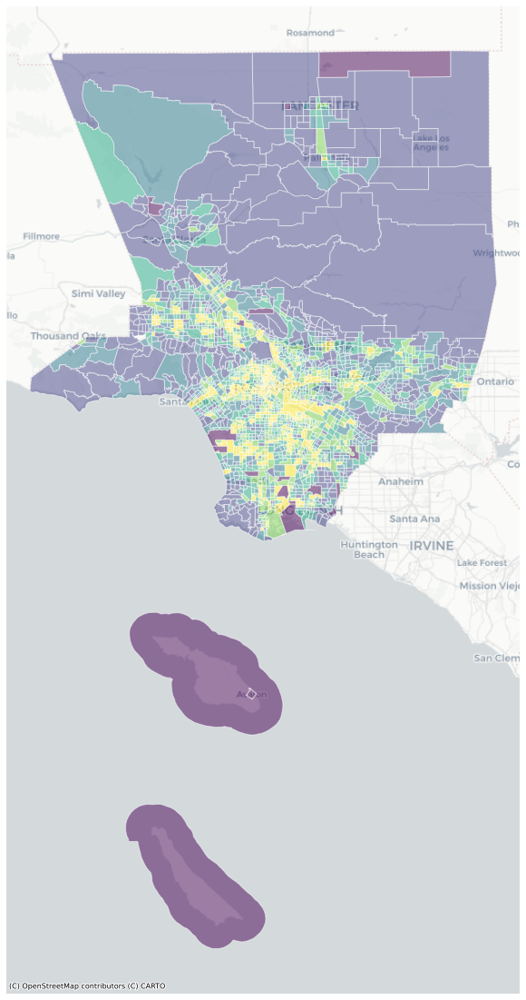

In [48]:
ax=census_tracts.plot(figsize=(20,20), 
                      edgecolor='white',
                      column='HazScore',
                      alpha=0.5)

ax.axis('off')

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)


In [49]:
crime = gpd.GeoDataFrame(df, 
                         crs='EPSG:4326',
                         geometry=gpd.points_from_xy(df.lon, df.lat))

In [50]:
crime = crime.to_crs(epsg=3857)

In [51]:
crime.geometry.total_bounds

array([-13208057.58262191,   3989781.06381585, -13153644.61552216,
         4072849.02638646])

In [52]:
minx, miny, maxx, maxy = crime.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)

-13208057.58262191
-13153644.615522156
3989781.063815847
4072849.0263864617


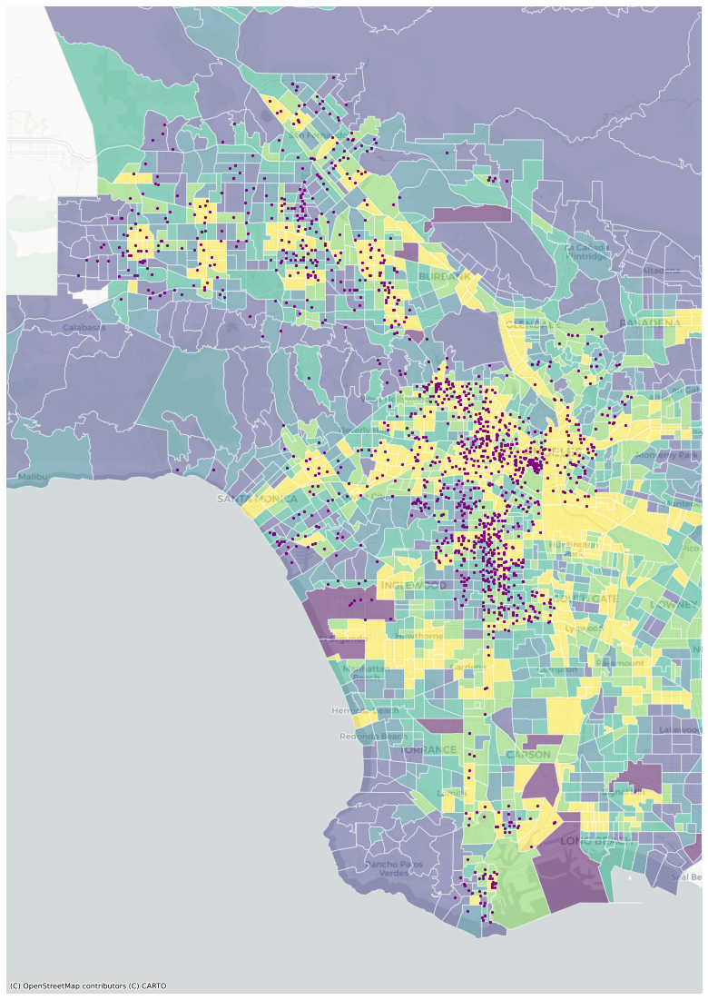

In [53]:
base = census_tracts.plot(figsize=(20,20), 
                      edgecolor='white',
                      column='HazScore',
                      alpha=0.5)

# define the layer that will go on top, and add the base layer to the `ax` argument
ax = crime.plot(ax=base, marker='o', color='purple', markersize=5)

ax.set_xlim(minx - 7000, maxx + 7000) # added/substracted value is to give some margin around total bounds
ax.set_ylim(miny - 7000, maxy + 7000)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)


In [60]:
def map_arrests_by_crime_type(charge='Aggravated Assault'):
    
    # subset the neighborhoods geodataframe for a single neighborhood
    crime = crime[crime.grp_description==charge]

    # use the bounding box coordinates to set the x and y limits
    minx, miny, maxx, maxy = crime.geometry.total_bounds

    # do a spatial join to get crime in neighborhood
    arrests_in_tracts = gpd.sjoin(census_tracts,crime,how='inner')

    # define the base layer to be the neighborhood polygon
    base = census_tracts.plot(figsize=(20,20), 
                    edgecolor='white',
                    column='HazScore',
                    alpha=0.5)

    # add the crime data, making sure to add the neighborhood polygon
    ax = arrests_in_tracts.plot(ax=base, 
                                    column='grp_description', 
                                    markersize=40, 
                                    legend=True,
                                    cmap='tab20',
                                    legend_kwds={
                                       'loc': 'upper right',
                                       'bbox_to_anchor':(1.3,1)
                                    }                  # this puts the legend to the side
                                )

    # set the map extent to the extent of the neighborhood bounds
    ax.set_xlim(minx - 200, maxx + 200) # added/substracted value is to give some margin around total bounds
    ax.set_ylim(miny - 200, maxy + 200)

    # turn off the axis
    ax.axis('off')

    # add a title
    ax.set_title('September 2020 Arrests by Crime '+crime.grp.values[0]+' Los Angeles',fontsize=20)

    # add a basemap
    ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
    ax

In [61]:
map_arrests_by_crime_type(charge='Aggravated Assault')

UnboundLocalError: local variable 'crime' referenced before assignment